# Image Processing in Python

In [1]:
from skimage import data, color # 拿裡面的 data 來用，color裡面則是有很多顏色處理的function
import numpy as np
import matplotlib.pyplot as plt

def show_image(image, title = "Image", cmap_type = "gray"): 
    plt.imshow(image, cmap_type) # cmap 是 color mapping 的縮寫，意思就是顏色的 gradient。例如數字的大小，你要用灰階，或是彩虹，或是xxx來呈現。
    plt.title(title)
    plt.axis("off")
    plt.show()

## Intro

* 首先要介紹 "影像" 到底是啥？
  * 如果是灰階圖片，那他就是個 2d-array (e.g. 1024x1024) 
  * 如果是彩色圖片，那他就是個 3d-array (e.g. 1024x1024x3)
  * 這些 array 中的數字，介於 0 ~ 255 之間。0表示程度很低，255表示程度很高。所以以灰階圖片來說，０就是黑色，255是白色，那中間的數字，就在說明顏色的深淺。
* 我們可以用 `matplotlib.pyplot`裡面的函數，來讀取/顯示影像 (e.g. 先引入 `import matplotlib.pyplot as plt`)
  * 讀取影像(e.g `my_image = plt.imread("my_image.jpeg")`)：讀進來，就可以看到 `my_image` 就是上面說的 2d or 3d array。
  * 顯示影像(e.g. `plt.imshow(my_image)`)：把 2d or 3d array 給顯示成圖片。

* 很快來看個例子：

### 彩色圖片

In [3]:
my_image = plt.imread("dataset/chapter 1/fruits-2.jpg")
print(my_image.shape)

(417, 626, 3)


* 可以看到，這張圖片的 shape 是 417 x 636 x 3，表示他的像素是 417 x 636; 然後是三個通道的彩色圖片
* 圖片長這樣：

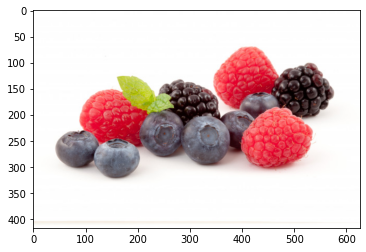

In [4]:
plt.imshow(my_image);

* 背後的 numpy array 長這樣：

In [5]:
my_image

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 255],
        [254, 254, 255],
        [254, 254, 255],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [254, 254, 254]]

* 第一個通道(紅色)的 array 長這樣：

In [6]:
my_image[:,:,0]

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 254, 254],
       [255, 255, 255, ..., 255, 254, 254],
       ...,
       [254, 254, 254, ..., 254, 254, 254],
       [254, 254, 254, ..., 254, 254, 254],
       [254, 254, 255, ..., 254, 255, 254]], dtype=uint8)

* 把三個通道分別畫成圖長這樣：

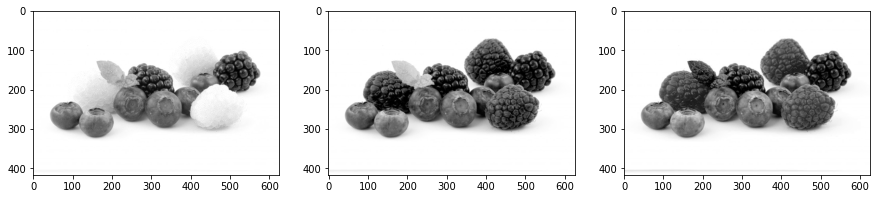

In [7]:
fig, ax = plt.subplots(1,3, figsize = (15, 15))
ax[0].imshow(my_image[:,:,0], cmap= "gray"); # 紅色通道，數值大小，用灰階來呈現
ax[1].imshow(my_image[:,:,1], cmap= "gray"); # 綠色通道，數值大小，用灰階來呈現
ax[2].imshow(my_image[:,:,2], cmap= "gray"); # 藍色通道，數值大小，用灰階來呈現

### 黑白圖片

* 黑白圖片，我們從`skimage`裡面的data模組來取：

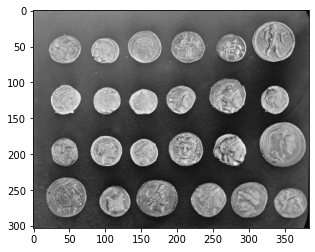

In [8]:
coins_image = data.coins()
plt.imshow(coins_image, cmap = "gray");

* 可以看到，這是張灰階圖片，來看下他的 sahpe 和 內容：  

In [9]:
print(coins_image.shape)
print(coins_image)

(303, 384)
[[ 47 123 133 ...  14   3  12]
 [ 93 144 145 ...  12   7   7]
 [126 147 143 ...   2  13   3]
 ...
 [ 81  79  74 ...   6   4   7]
 [ 88  82  74 ...   5   7   8]
 [ 91  79  68 ...   4  10   7]]


* 可以看到，是 303x384 的 shape，只是個 2d array (只有一個通道了)
* 內容是 0~255 的數字

### Histogram

* 讀取一張圖片後，如果有 RGB 三個 channel，那每個 channel 就會是一張矩陣，裡面的數值代表 R or G or B 的程度 (0就是沒有程度，255就是程度最高)
* 所以，我如果取出 R channel 的矩陣後，可以把裡面的 element 全都拿出來，做個 histogram，就可以知道，這張圖紅色程度的分布狀況
* 來看個例子，原始圖片長這樣：

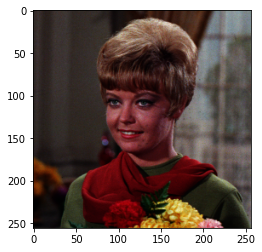

In [22]:
image = plt.imread("dataset/chapter 1/4.1.01.tiff")
plt.imshow(image);

* 我們可以取出紅色 channel 的矩陣來：

In [23]:
print("The shape of original image: " + str(np.shape(image)))
red_channel = image[:,:,0]
print("The shape of red_channel image: " + str(np.shape(red_channel)))
print("red_channel data:")
red_channel

The shape of original image: (256, 256, 3)
The shape of red_channel image: (256, 256)
red_channel data:


array([[ 52,  47,  50, ..., 137, 126, 126],
       [ 55,  50,  54, ..., 129, 129, 121],
       [ 46,  49,  52, ..., 126, 123, 118],
       ...,
       [  4,   3,   3, ...,  60,  84,  98],
       [ 11,  12,  12, ...,  60,  86, 100],
       [ 20,  19,  20, ...,  55,  70,  93]], dtype=uint8)

* 如果要畫圖的話，我想把這個 2-d array，先轉成向量，可以這樣做：

In [24]:
red_channel_vector = red_channel.ravel()
print("The shape of red_channel_vector: "+str(np.shape(red_channel_vector)))
print("The red_channel_vector data: ")
red_channel_vector

The shape of red_channel_vector: (65536,)
The red_channel_vector data: 


array([52, 47, 50, ..., 55, 70, 93], dtype=uint8)

* 大功告成，來畫圖吧：

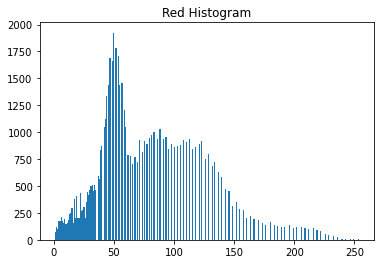

In [25]:
plt.hist(red_channel_vector, bins=256)
plt.title('Red Histogram')
plt.show()

* 可以看到，pixels 的值，頗集中在100以下，表示這張圖的紅色，大多是 bright red pixels，比較亮紅

## 基礎影像處理  

* 由此可知，影像處理，就是把圖片先載進來變成 2d or 3d array後，我們去對裡面的數字做手腳，那再把這個矩陣寫回成圖片，就完成影像處理了。而 `numpy` 和 `skimage` 這2個package裡面就有很多好用的 function，可以幫我們做這些處理。例如：
  * `skimage.color.rgb2gray()` 可以把rgb圖片轉成灰階， `skimage.color.gray2rgb()` 可以把灰階轉成rgb. 
  * `np.flipud(my_image)` 可以把我的圖片 up down 翻轉，`np.fliplr(my_image)` 可以把我的圖片 left right 翻轉

### rgb 改 灰階，或，灰階 改 rgb

* 我們可以用 `skimage` 裡面的 `color` 這個模組下的
  * `rgb2gray()`，可把rgb的影像，轉成灰階 (所以會從 3d array 被轉成 2d array)
  * `gray2rgb()`，可把灰階的影像，轉成 rgb
* 來試試看吧：

In [10]:
my_image_gray = color.rgb2gray(my_image)
my_image_gray.shape

(417, 626)

* 可以看到，現在圖片只剩二維，來看一下資料：

In [11]:
my_image_gray

array([[1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 0.99607843,
        0.99607843],
       [1.        , 1.        , 1.        , ..., 1.        , 0.99607843,
        0.99607843],
       ...,
       [0.99607843, 0.99607843, 0.99607843, ..., 0.99607843, 0.99607843,
        0.99607843],
       [0.99636118, 0.99636118, 0.99636118, ..., 0.99607843, 0.99607843,
        0.99607843],
       [0.99607843, 0.99607843, 1.        , ..., 0.99607843, 1.        ,
        0.99607843]])

* 的確變成二維，但資料現在是 0 ~ 1 之間了，不是 0 ~ 255 (不知為何)
* 看一下圖：

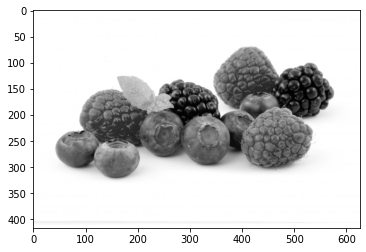

In [12]:
plt.imshow(my_image_gray, cmap = "gray");

* 如果把它轉回來

In [13]:
my_image_reconstruct = color.gray2rgb(my_image_gray)
my_image_reconstruct.shape

(417, 626, 3)

* 的確變回 3d array，但...蠻怪的，一維不知怎麼變回三維。
* 來看看圖：

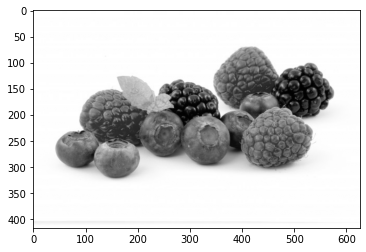

In [14]:
plt.imshow(my_image_reconstruct);

* 恩...看起來還是很灰階，不知道是不是因為各個通道都介於 0 ~ 1 之間

In [15]:
my_image_reconstruct[:,:,0]

array([[1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 0.99607843,
        0.99607843],
       [1.        , 1.        , 1.        , ..., 1.        , 0.99607843,
        0.99607843],
       ...,
       [0.99607843, 0.99607843, 0.99607843, ..., 0.99607843, 0.99607843,
        0.99607843],
       [0.99636118, 0.99636118, 0.99636118, ..., 0.99607843, 0.99607843,
        0.99607843],
       [0.99607843, 0.99607843, 1.        , ..., 0.99607843, 1.        ,
        0.99607843]])

In [16]:
my_image_reconstruct[:,:,1]

array([[1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 0.99607843,
        0.99607843],
       [1.        , 1.        , 1.        , ..., 1.        , 0.99607843,
        0.99607843],
       ...,
       [0.99607843, 0.99607843, 0.99607843, ..., 0.99607843, 0.99607843,
        0.99607843],
       [0.99636118, 0.99636118, 0.99636118, ..., 0.99607843, 0.99607843,
        0.99607843],
       [0.99607843, 0.99607843, 1.        , ..., 0.99607843, 1.        ,
        0.99607843]])

### 翻轉圖片

* 他的概念，就是把本來 RGB 三個通道的矩陣數值，做上下的翻轉
* 做個實驗就知道了

In [17]:
my_exp = np.array([[1, 2], [3, 4]]);
print("原圖")
print(my_exp)
print("原圖做上下翻轉後")
print(np.flipud(my_exp))
print("原圖做左右翻轉後")
print(np.fliplr(my_exp))

原圖
[[1 2]
 [3 4]]
原圖做上下翻轉後
[[3 4]
 [1 2]]
原圖做左右翻轉後
[[2 1]
 [4 3]]


* 那現在換成圖片，他就是做一樣的事，來看看原圖的樣子：

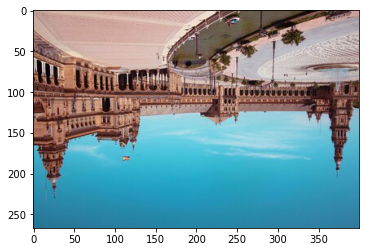

In [19]:
flipped_seville = plt.imread("./dataset/chapter 1/sevilleup(2).jpg")
plt.imshow(flipped_seville);

* 那我希望把它上下翻轉，我可以這樣做：

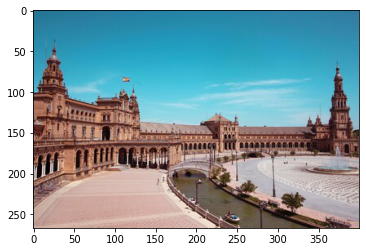

In [20]:
seville_vertical_flip = np.flipud(flipped_seville)
plt.imshow(seville_vertical_flip);

* 如果我想左右翻轉，我可以這樣做:

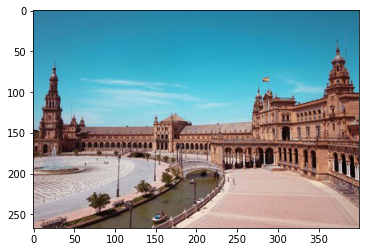

In [21]:
seville_horizontal_flip = np.fliplr(seville_vertical_flip)
plt.imshow(seville_horizontal_flip);

### Thresholding

* Thresholding 照字面的意思，就是要訂一個閾值。  
* 這個閾值  
  * 可以是 global 的閾值 (e.g. 200)，那我的整張圖片的矩陣數值資料中，只要大於 200，我就 coding 為 255，否則 coding 為 0  
  * 也可以是 local 的閾值 (e.g. 左上角的區域，200; 左下角的區域，100; ...)，那我整張圖片的矩陣數值資料，就是去和 local 閾值比，大於 200，我就 coding 為 255，否則 coding 為 0  
* 所以，做完 thresholding 後，以灰階為例，就變成非黑即白的高對比圖片。  
* 那轉成黑白要幹麻？簡單講，就是把訊號(foreground)跟雜訊(background)給區分出來，就可以專注在看訊號就好。
* 如果是彩色圖片，也很常先轉灰階，在做 thresholding，得到黑白圖片. 

#### Global threshold

* Global threshold 的意思，就是整張圖片，我只訂一個 global 的閾值  
* 這種做法，適用在 background 是很 uniform 的時候 (就是 background 的區域的那些數值的 variation 很小)
* 來看個例子，我有張圖長這樣：

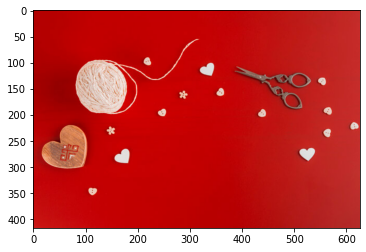

In [29]:
tools_image = plt.imread("./dataset/chapter 1/shapes52.jpg")
plt.imshow(tools_image);

* 可以明顯的看出來，紅色是背景，其他是 signal
* 而且，背景一看就全是紅的，非常均勻，所以用 global threshold 就好
* 那標準動作，先把圖片轉灰階：

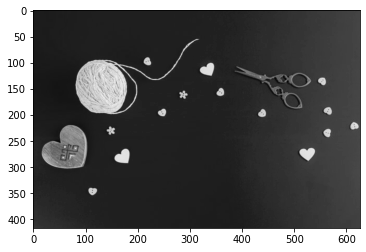

In [30]:
gray_tools_image = color.rgb2gray(tools_image)
plt.imshow(gray_tools_image, "gray");

(417, 626)


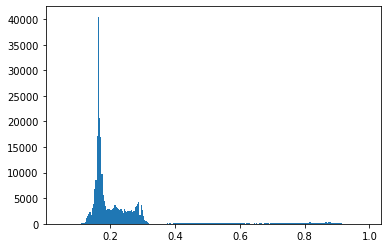

In [32]:
print(np.shape(gray_tools_image))
plt.hist(gray_tools_image.ravel(), bins = 256);

* 可以看到，轉成灰階後，變成 417*626 的矩陣，裡面的數值，都介於 0~1 之間
* 從 hisgogram 來看，資料似乎都集中在 0.4 以下的區域，只剩下少部分的資料在 0.4以上. 
* 那從圖片來看，背景本來就應該站絕大絕大多數的像素，所以，我如果把 threshold 訂在 0.4 ，那也許就能區分出背景和主角

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


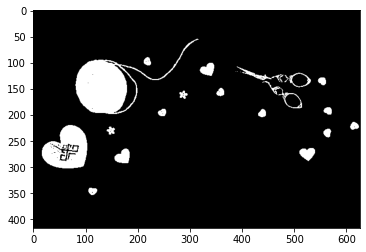

In [42]:
my_threshold = (gray_tools_image > 0.4)*1
print(my_threshold)
plt.imshow(my_threshold, cmap = "gray");

* 每賣喔～這樣大概可以猜到，global thresholding 的演算法，就是要找到一個閾值k，使得背景和主角分的越開越好. 
* 那我們這邊就直接用套件吧  
* `skimage` 裡的 `filters` 模組裡面，有各種演算法來當你找出 optimal threshold，這邊先介紹 `otsu` 這種方法，funtion name 叫 `threshold_otsu` 

In [43]:
from skimage.filters import threshold_otsu

# Obtain the optimal threshold value with otsu
thresh = threshold_otsu(gray_tools_image)

# 看一下 thresh 的數值
thresh

0.46032394761029416

* 看起來很接近我剛剛自己猜的 0.4 了。那來試試這個比較精準的 threshold 吧：

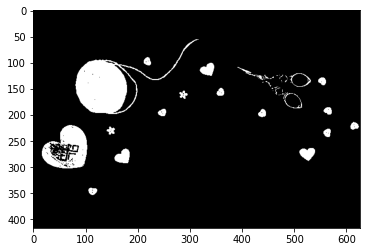

In [45]:
binary_image = gray_tools_image > thresh
plt.imshow(binary_image, 'gray');

* 搞定了，現在的圖片，就變成黑白而已。
* 除了 `otsu` 外，還有很多種算 optimal threshold 的方法。
* 我們可以用 `try_all_threshold()` 這個 function 來一網打盡，看哪個比較好：

skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


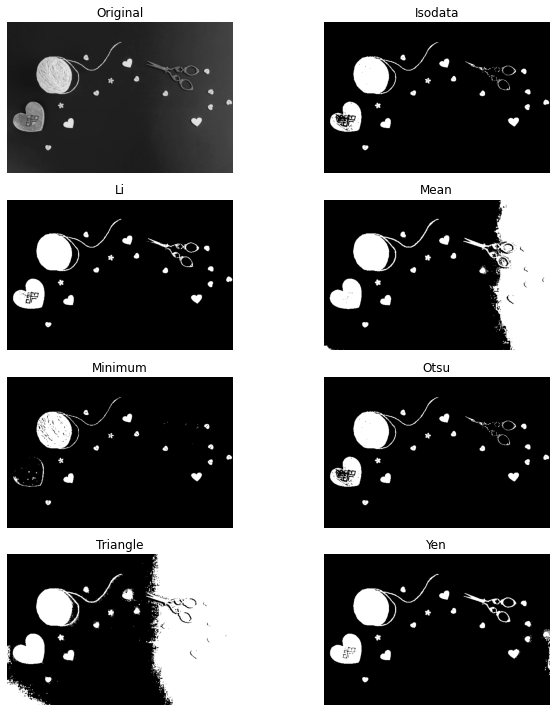

In [50]:
from skimage.filters import try_all_threshold
fig, ax = try_all_threshold(gray_tools_image, figsize=(10, 10))
plt.show()

* 可以看到，除了剛剛用過的 `otsu` 外，還有 6 種方法。但課程裡是都沒講這些方法的原理啦。

#### Local threshold

* 有時候，background不是那麼容易分辨，換句話說，background的區域所對應到的那堆數字，variation很大的時候，那就不適合只用單一global threshold 去切分，而是要不同區域用不同的 threshold 來切分
* 這種做法，就是 local threshold
* 舉例來說，我現在有張圖片長這樣：

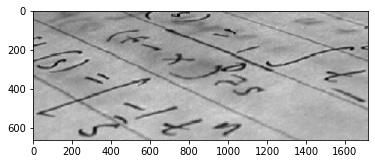

In [93]:
text_page_original = plt.imread("./dataset/chapter 1/text_page.jpg")
page_image = color.rgb2gray(text_page_original)*255
plt.imshow(page_image, "gray");

* 可以看到，背景是很不均勻的，如果我畫他的 histogram，會長這樣：

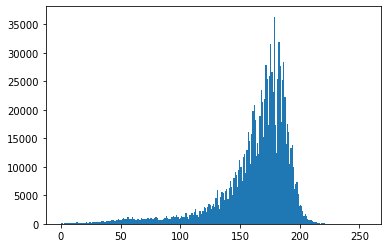

In [95]:
plt.hist(page_image.ravel(), bins = 256);

* 可以發現，資料沒有很明顯的集中在哪裡，也就是背景的像素數字大小是分散的。
* 所以，可以想像，用 global thresholding 的效果不會太好：

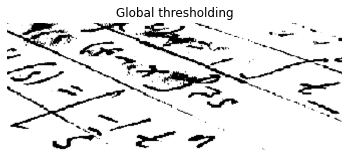

In [96]:
# Obtain the optimal otsu global thresh value
global_thresh = threshold_otsu(page_image)

# Obtain the binary image by applying global thresholding
binary_global = page_image > global_thresh

# Show the binary image obtained
show_image(binary_global, 'Global thresholding')

* 那如果改成 local thresholding:

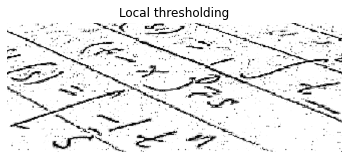

In [99]:
# Import the local threshold function
from skimage.filters import threshold_local

# Set the block size to 35
block_size = 35

# Obtain the optimal local thresholding
local_thresh = threshold_local(page_image, block_size, offset=10)

# Obtain the binary image by applying local thresholding
binary_local = page_image > local_thresh

# Show the binary image
show_image(binary_local, 'Local thresholding')

* 可以看到，效果有比較好了。來看看他的 local 閾值

In [100]:
local_thresh

array([[115.61205444, 115.74809474, 116.0130664 , ..., 165.04046072,
        164.99800755, 164.97534566],
       [115.90690542, 116.04150117, 116.30365651, ..., 165.12585896,
        165.08232485, 165.05908989],
       [116.48060471, 116.61241352, 116.86913412, ..., 165.28483187,
        165.2391841 , 165.21483082],
       ...,
       [172.71352617, 172.73978733, 172.78898383, ..., 166.29693803,
        165.90156598, 165.69604183],
       [172.85026087, 172.87879006, 172.93228549, ..., 166.08484146,
        165.67927438, 165.46841166],
       [172.92029422, 172.94999271, 173.00570422, ..., 165.97330777,
        165.56260417, 165.34905153]])

## Filters

* filter 是用來 enhancing an image，例如：
  * edge detection (把圖型的輪廓/邊緣標出來)
  * smoothing (blurring to reduce noice)
  * emphasize or remove features 
  
  * sharpening
  

### Edge detection

* edge detection(邊緣檢測) 是 computer vision裡的一個技術  
* 這邊介紹了 `索伯算子（Sobel operator`，他是圖像處理中的算子之一，有時又稱為索伯-費德曼算子或索貝濾波器  
* 課程都沒講他的原理，看 wiki 可以知道，概念上，索伯算子就是一個2個整數型的矩陣(都是3x3)，對整張影像在水平及垂直方向上做捲積，做完後後，就可以得到一張圖像的邊緣特徵。 * 課程只有給你 code，如下： 


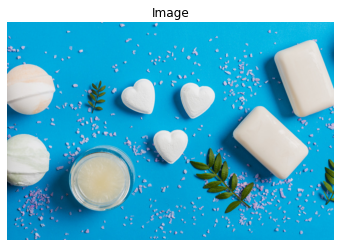

In [101]:
# 原圖
soaps_image = plt.imread("./dataset/chapter 2/soap_image.jpg")
show_image(soaps_image)

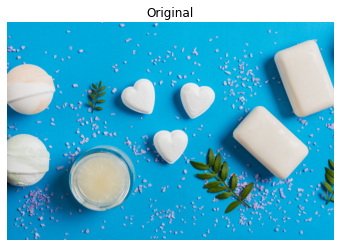

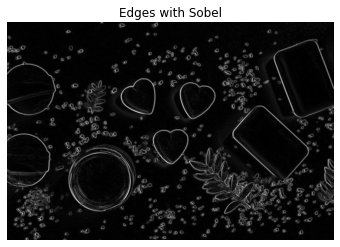

In [102]:
# Import the filters module and sobel function
from skimage.filters import sobel

# 先轉灰階
soaps_image_gray = color.rgb2gray(soaps_image)

# Apply edge detection filter
edge_sobel = sobel(soaps_image_gray)

# Show original and resulting image to compare
show_image(soaps_image, "Original")
show_image(edge_sobel, "Edges with Sobel")

In [ ]:
def plot_comparison(original, filtered, title_filtered):
    fig, (ax1, ax2) = plt.subplots(
        ncols = 2, figsize = (8,6), sharex = True, sharey = True
    )
    ax1.imshow(original, cmap = plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis('off')
    

from skimage.filters import sobel

# edge detection filter
edge_sobel = sobel(image_coins)
plot_comparison(image_coins, edge_sobel, "Edge with Sobel")

from skimage.filters import gaussian
gaussian_image = gaussian(amsterdam_pic, multichannel = True)
plot_comparison()

### smoothing

* 我們來看一下這張照片

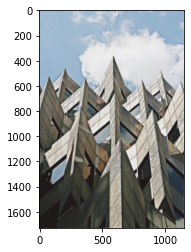

In [104]:
building_image = plt.imread("dataset/chapter 2/building_image.jpg")
plt.imshow(building_image);

* 現在，我們想讓照片的那些尖角的地方，變得圓滑一點(smoothing). 
* 這邊介紹的是 `gaussian filter`. 

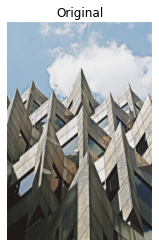

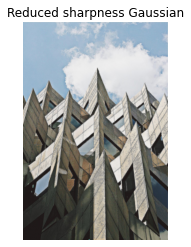

In [105]:
# Import Gaussian filter 
from skimage.filters import gaussian

# Apply filter
gaussian_image = gaussian(building_image, multichannel = True)

# Show original and resulting image to compare
show_image(building_image, "Original")
show_image(gaussian_image, "Reduced sharpness Gaussian")

### Contrast enhancement (加強對比度)

#### global method

* 以灰階影像為例，一張照片的對比度，就是用像素裡的最大值-最小值來決定。
* 所以，如果想加大對比度，就是盡量讓像素的最小值往0拉，最大值往255拉，那圖片就會變得對比度比較強烈
* 所以，這邊就介紹了 histogram equalization 的方法
* 概念上，就像下圖(取自維基)：

In [108]:
%%html
<img src = "dataset/chapter 2/contrast_example.jpg">

* 算法上也很直覺，我要轉換某個像素的值的時候，先算出該值的PR，然後再乘以灰階級數(e.g. 0~255的話，灰階級數就是 255- 0 = 255)
* 舉例來說，最左上角的像素，如果他原始灰階值是78，對應到整張圖後的PR是0.7，那轉換後的灰階值就是 0.7x255=178.5
* 所以就可以了解，他就是想讓轉換後的像素的灰階值，是均勻的從0一路走到255
* 接著來看看 code 可以怎麼寫

Contrast =  0.6745098


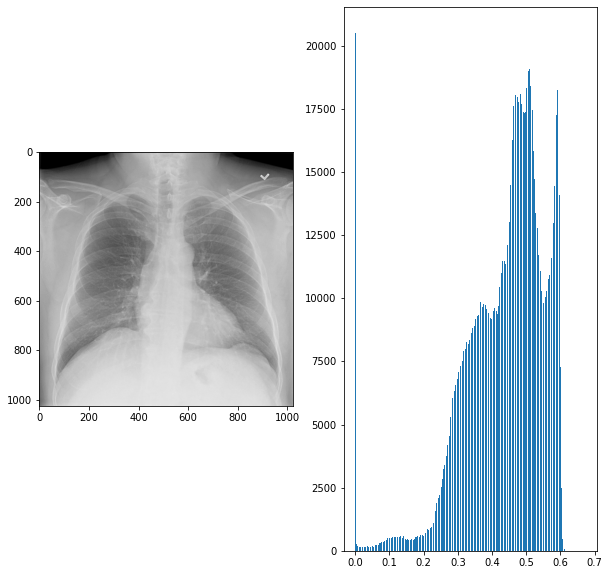

In [120]:
# 轉換前
chest_xray_image = plt.imread("dataset/chapter 2/chest_xray_image.png");
contrast = np.max(chest_xray_image) - np.min(chest_xray_image)
print("Contrast = ", contrast)

fig, axes = plt.subplots(1,2, figsize = (10, 10))
axes[0].imshow(chest_xray_image, cmap = "gray");
axes[1].hist(chest_xray_image.ravel(), bins = 256);

Contrast =  0.9804420471191406


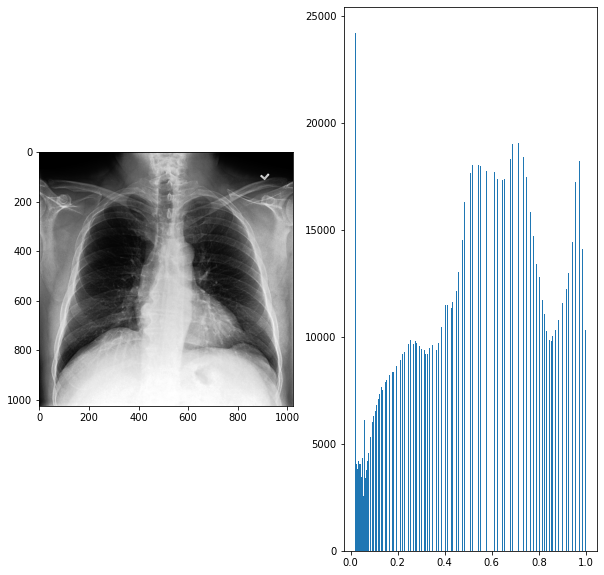

In [121]:
# 轉換後

from skimage import exposure

# Use histogram equalization to improve the contrast
xray_image_eq =  exposure.equalize_hist(chest_xray_image)

contrast = np.max(xray_image_eq) - np.min(xray_image_eq)
print("Contrast = ", contrast)

fig, axes = plt.subplots(1,2, figsize = (10, 10))
axes[0].imshow(xray_image_eq, cmap = "gray");
axes[1].hist(xray_image_eq.ravel(), bins = 256);

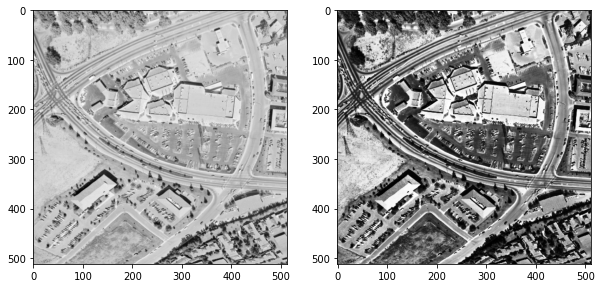

In [125]:
image_aerial = plt.imread("dataset/chapter 2/image_aerial.tiff")

# Import the required module
from skimage import exposure

# Use histogram equalization to improve the contrast
image_eq =  exposure.equalize_hist(image_aerial)

# Show the original and resulting image
fig, axes = plt.subplots(1,2, figsize = (10, 10))
axes[0].imshow(image_aerial, cmap = "gray");
axes[1].imshow(image_eq, cmap = "gray");

* 可以看到，街道和很多細節都看得更清楚了

#### local method

* 剛剛介紹的 histogram，是對：  
  * 灰階
  * 全部的像素，都做 equalize. 
* 那對於彩色圖片，如果分別對 RGB 做 histogram equalization，出來的結果會有點不協調. 
* 所以，這邊介紹另一種 local 的 histogram equalization (可以想像，他是各個局部區域，自己做 histogram equalization，所以可以讓各個局部的contrast都變更大，細節更清楚)，叫做 Contrast Limited Adaptive Histogram Equalization (CLAHE)

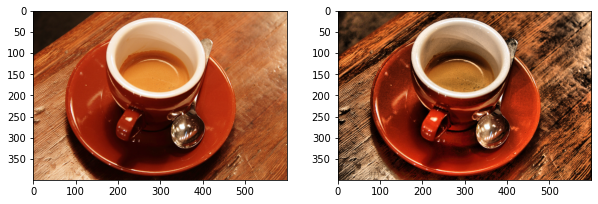

In [126]:
# Import the necessary modules
from skimage import data, exposure

# Load the image
original_image = data.coffee()

# Apply the adaptive equalization on the original image
adapthist_eq_image = exposure.equalize_adapthist(original_image, clip_limit=0.03)

# Compare the original image to the equalized
fig, axes = plt.subplots(1,2, figsize = (10, 10))
axes[0].imshow(original_image, cmap = "gray");
axes[1].imshow(adapthist_eq_image, cmap = "gray");

## Transformation

### rotate

* 可以用 `skimage.transform.rotate()` 這個 function. 

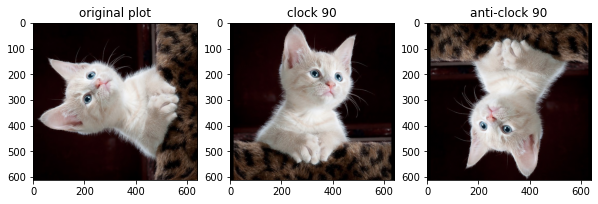

In [135]:
image_cat = plt.imread("dataset/chapter 2/image_cat.jpg")

from skimage.transform import rotate

# 順時鐘轉 90 度
rotated_cat1 = rotate(image_cat, -90)

# 逆時鐘轉 90 度
rotated_cat2 = rotate(image_cat, 90)

fig, axes = plt.subplots(1,3, figsize = (10, 10))
axes[0].imshow(image_cat);
axes[0].set_title("original plot");
axes[1].imshow(rotated_cat1);
axes[1].set_title("clock 90");
axes[2].imshow(rotated_cat2);
axes[2].set_title("anti-clock 90");

### rescale & aliasing

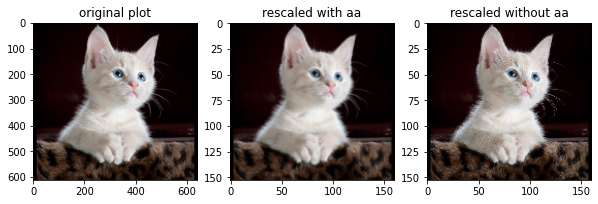

In [139]:
from skimage.transform import rescale

# Rescale with anti aliasing
rescaled_with_aa = rescale(rotated_cat1, 1/4, anti_aliasing=True, multichannel=True)

# Rescale without anti aliasing
rescaled_without_aa = rescale(rotated_cat1, 1/4, anti_aliasing=False, multichannel=True)

fig, axes = plt.subplots(1,3, figsize = (10, 10))
axes[0].imshow(rotated_cat1);
axes[0].set_title("original plot");
axes[1].imshow(rescaled_with_aa);
axes[1].set_title("rescaled with aa");
axes[2].imshow(rescaled_without_aa);
axes[2].set_title("rescaled without aa");

* Seems like the anti aliasing filter prevents the poor pixelation effect to happen, making it look better but also less sharp.

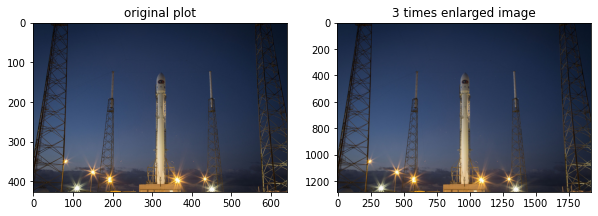

In [153]:
# Import the module and function to enlarge images
from skimage.transform import rescale

# Import the data module
from skimage import data

# Load the image from data
rocket_image = data.rocket()

# Enlarge the image so it is 3 times bigger
enlarged_rocket_image = rescale(rocket_image, 3, anti_aliasing=True, multichannel=True)

# Show original and resulting image
fig, ax = plt.subplots(1,2, figsize = (10,10))
ax[0].imshow(rocket_image);
ax[0].set_title("original plot")
ax[1].imshow(enlarged_rocket_image);
ax[1].set_title("3 times enlarged image");

* 可以看到，從 600 pixels 擴展到 2500 pixels，畫面也不算變得太糊
* 另外，我們也可以等比例的縮小圖片，例如下例:

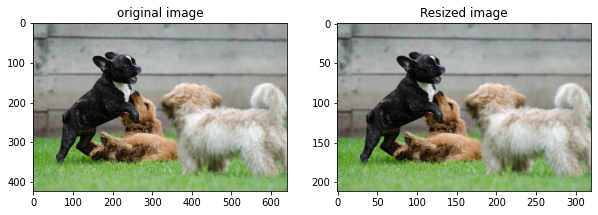

In [155]:
dogs_banner = plt.imread("dataset/chapter 2/dogs_banner.jpg")

# Import the module and function
from skimage.transform import resize

# Set proportional height so its half its size
height = int(dogs_banner.shape[0] / 2)
width = int(dogs_banner.shape[1] / 2)

# Resize using the calculated proportional height and width
image_resized = resize(dogs_banner, (height, width),
                       anti_aliasing=True)

# Show original and resulting image
fig, ax = plt.subplots(1,2, figsize = (10,10))
ax[0].imshow(dogs_banner);
ax[0].set_title("original image")
ax[1].imshow(image_resized);
ax[1].set_title("Resized image");

* 我們成功地將照片縮小到 1/2 的像素，這些小圖片佔的空間更小，可以方便我們使用(e.g. 上傳到網頁之類的)

### Morphology

* morphology 的意思是 "型態"，就是要改變原圖的型態  
* 其實，我覺得從範例來看，他更像在更改輪廓
* 這邊處理的資料都先限縮在 `binary` 的 image (就是做過 thresholding 的圖片，像素的亮度只剩下 0 or 1 兩種)
* 更改輪廓的方式分為兩種：  
  * dilation(膨脹): 找到畫素為 1 的點，將它鄰近的點都設成1 (因為 1 表示白巳，所以膨脹可以擴大白色的範圍)
  * erosion(腐蝕): 和 dilation 的做法相法，他是去找畫素為 0 的點，將他鄰近也都設為 0 (所以就像把輪廓變小) 
* 來看例子：

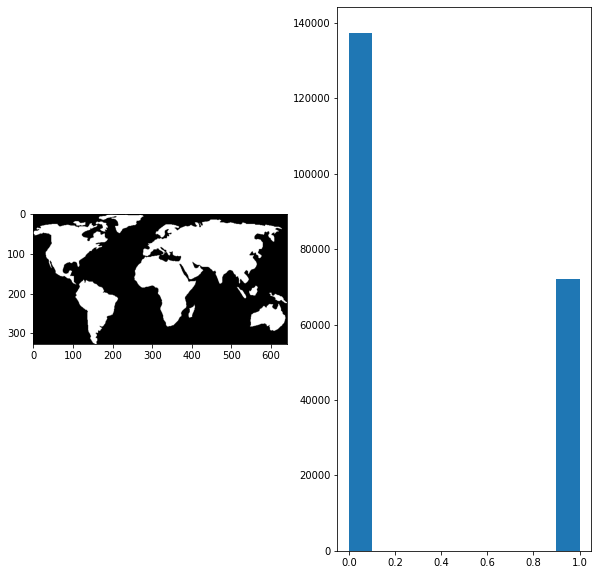

In [179]:
world_image_binary = plt.imread("dataset/chapter 2/world_image_binary.jpg")
world_image_binary = (world_image_binary > 100)*1

fig, ax = plt.subplots(1, 2, figsize = (10, 10))
ax[0].imshow(world_image_binary, cmap = "gray");
ax[1].hist(world_image_binary.ravel());

* 接下來，示範 dialation 和 erotion

In [180]:
# Import the morphology module
from skimage import morphology

dilated_image = morphology.binary_dilation(world_image_binary)
eroded_image = morphology.binary_erosion(upper_r_image) 

# See results
fig, ax = plt.subplots(1,3, figsize = (10,10))
ax[0].imshow(upper_r_image);
ax[0].set_title("original image");

ax[1].imshow(dilated_image);
ax[1].set_title("dialated image");

ax[2].imshow(eroded_image_shape);
ax[2].set_title("Eroded image");

ValueError: Unsupported dtype

<Figure size 720x720 with 3 Axes>

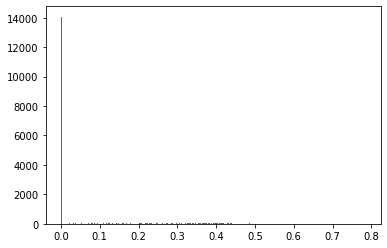

In [162]:
upper_r_image = plt.imread("dataset/chapter 2/r5.png")
plt.hist(upper_r_image.ravel(), bins = 256);

In [171]:
# Import the morphology module
from skimage import morphology

# Obtain the eroded shape 
eroded_image_shape = morphology.binary_erosion(upper_r_image) 

# See results
# Show original and resulting image
fig, ax = plt.subplots(1,2, figsize = (10,10))
ax[0].imshow(upper_r_image);
ax[0].set_title("original image")
ax[1].imshow(eroded_image_shape);
#ax[1].set_title("Eroded image");

ValueError: Unsupported dtype

<Figure size 720x720 with 2 Axes>

## Image restoration(影像修復)

### 重建指定的區域

* 這邊的應用，我把它想成 missing data 的插補，舉例來說以下兩張圖：  

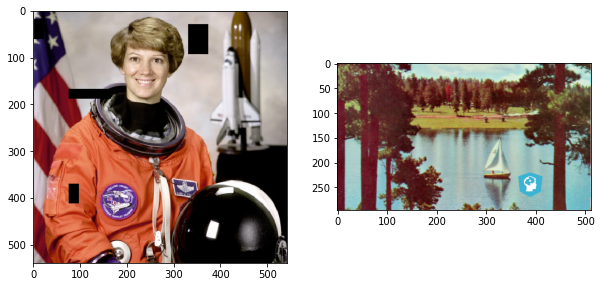

In [188]:
defect_image = plt.imread("dataset/chapter 3/damaged_astronaut.png")
image_with_logo = plt.imread("dataset/chapter 3/4.2.06_w_logo_2_2.png")

fig, ax = plt.subplots(1, 2, figsize = (10, 10));
ax[0].imshow(defect_image);
ax[1].imshow(image_with_logo);

* 可以看到，左圖的頭的旁邊，有一塊黑色區域，被挖掉了。右圖則是船的旁邊，多了 datacamp 的 logo. 
* 那我現在想做的，就是把左邊的黑色區域補起來，右邊的 logo 移除. 
* 那作法就是：  
  * 我先做出一個 mask (和原圖有一樣的 shape ，但指定的區域給他數值 1，其他就數值 0). 
  * 用 `skimage.inpaint.inpaint_biharmonic()` 來做補值，補哪裡？補 mask 所指的地方. 
* 來看右圖的範例：

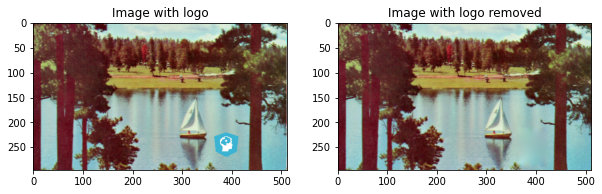

In [191]:
# Initialize the mask
mask = np.zeros(image_with_logo.shape[:-1])

# Set the pixels where the logo is to 1
mask[210:290, 360:425] = 1

# Apply inpainting to remove the logo
image_logo_removed = inpaint.inpaint_biharmonic(image_with_logo,
                                  mask,
                                  multichannel=True)

# Show the original and logo removed images
fig, ax = plt.subplots(1, 2, figsize = (10, 10));
ax[0].imshow(image_with_logo);
ax[0].set_title("Image with logo");

ax[1].imshow(image_logo_removed);
ax[1].set_title("Image with logo removed");

In [183]:
# Import the module from restoration
from skimage.restoration import inpaint

# Apply the restoration function to the image using the mask
restored_image = inpaint.inpaint_biharmonic(defect_image, mask, multichannel=True) # mask 要自己建，他沒告訴你怎麼做，直接 preload 給你，傻眼
show_image(restored_image)

NameError: name 'get_mask' is not defined

### Denoise

* denoise 的方法有四種，基本上都沒講原理，給你 code 而已：  
  * Total variation (TV): 用 `skimage.restoration.denoise_tv_chambolle()`
  * Bilateral: 適用於想要同時保留 edges。 用 `skimage.restoration.denoise_bilateral()`
  * Wavelet denoising. 
  * Non-local means denoising

Text(0.5, 1.0, 'Denoised by bilateral')

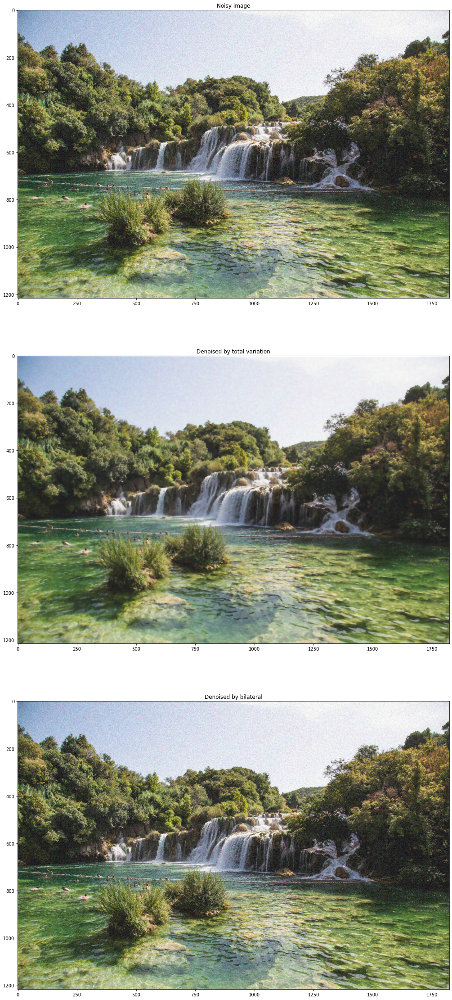

In [196]:
landscape_image = plt.imread("dataset/chapter 3/noise-noisy-nature.jpg")

# Import bilateral denoising function
from skimage.restoration import denoise_tv_chambolle, denoise_bilateral

# Apply bilateral filter denoising
tv_denoised_image = denoise_tv_chambolle(landscape_image, multichannel=True)
bi_denoised_image = denoise_bilateral(landscape_image, multichannel=True)

# Show original and resulting images
fig, ax = plt.subplots(3, 1, figsize = (40, 40))
ax[0].imshow(landscape_image)
ax[0].set_title("Noisy image")

ax[1].imshow(tv_denoised_image)
ax[1].set_title("Denoised by total variation")

ax[2].imshow(bi_denoised_image)
ax[2].set_title("Denoised by bilateral")

### Superpixel segementation

* 這邊的概念是，把一張圖上的 pixel 做分群  
* 例如下圖，本來有 265x191 = 50615 個 pixel，我們想把他分成 400 個 region. 

<ipython-input-198-de831a9c1cc8>:10: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  segments = slic(face_image, n_segments = 400)
<ipython-input-198-de831a9c1cc8>:13: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  segmented_image = label2rgb(segments, face_image, kind='avg')


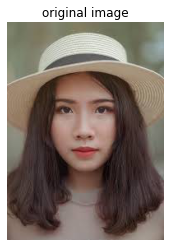

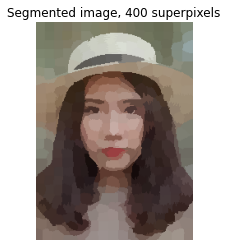

In [198]:
face_image = plt.imread("dataset/chapter 3/chinese.jpg")

# Import the slic function from segmentation module
from skimage.segmentation import slic

# Import the label2rgb function from color module
from skimage.color import label2rgb

# Obtain the segmentation with 400 regions
segments = slic(face_image, n_segments = 400)

# Put segments on top of original image to compare
segmented_image = label2rgb(segments, face_image, kind='avg')

# Show the segmented image
show_image(face_image, "original image")
show_image(segmented_image, "Segmented image, 400 superpixels")